In [1]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cmap
import seaborn as sns

from sklearn.metrics import confusion_matrix

import tensorflow as tf
from tensorflow import keras
from keras import layers
from keras.applications import EfficientNetB0, MobileNetV2
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
from keras.utils import plot_model

import warnings
warnings.filterwarnings('ignore')

C:\Users\BryzginKA\AppData\Roaming\Python\Python311\site-packages\keras\src\export\tf2onnx_lib.py:8: FutureWarning: In the future `np.object` will be defined as the corresponding NumPy scalar.
  if not hasattr(np, "object"):


## **Импорт обучающего набора**

In [2]:
DATASET_DIR = 'Dataset'
IMG_SIZE = 128
BATCH_SIZE = 16
NUM_CLASSES = 2

train_ds = keras.utils.image_dataset_from_directory(
    os.path.join(DATASET_DIR, '01_Train'),
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    shuffle=True
)

val_ds = keras.utils.image_dataset_from_directory(
    os.path.join(DATASET_DIR, '02_Val'),
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    shuffle=False
)

test_ds = keras.utils.image_dataset_from_directory(
    os.path.join(DATASET_DIR, '03_Test'),
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    shuffle=False
)

class_names = train_ds.class_names
print('Классы:', class_names)

Found 310 files belonging to 2 classes.
Found 64 files belonging to 2 classes.
Found 64 files belonging to 2 classes.
Классы: ['ImpactStructures', 'VolcanoStructures']


# **Модель на основе EfficientNetB0 (базовая)**

## **Разработка архитектуры**

In [3]:
# Загрузка базовой модели
EfficientNetB0_backbone = EfficientNetB0(
    include_top=False,
    weights='imagenet',
    input_shape=(IMG_SIZE, IMG_SIZE, 3)
)

# Разрешаем обучение
EfficientNetB0_backbone.trainable = True

# Замораживаем все, кроме BatchNormalization
for layer in EfficientNetB0_backbone.layers:
    if isinstance(layer, layers.BatchNormalization):
        layer.trainable = True
    else:
        layer.trainable = False


# Входной слой
inputs = keras.Input(shape=(IMG_SIZE, IMG_SIZE, 3), name='input_layer')

# Аугментация
x = layers.RandomFlip('horizontal', name='augmentation_flip')(inputs)
x = layers.RandomRotation(0.15, fill_mode='reflect', name='augmentation_rotation')(x)
x = layers.RandomZoom(0.15, fill_mode='reflect', name='augmentation_zoom')(x)
x = layers.RandomContrast(0.2, name='augmentation_contrast')(x)

# Препроцессинг
x = keras.applications.efficientnet.preprocess_input(x)
x = EfficientNetB0_backbone(x, training=False)

# Новый классификатор
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
x = layers.BatchNormalization()(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.4)(x)

# Выходной слой
outputs = layers.Dense(NUM_CLASSES, activation='softmax')(x)

# Сборка модели
base_model = keras.Model(inputs, outputs, name='EfficientNetB0_base_model')

# Компиляция модели
base_model.compile(
    optimizer=keras.optimizers.Adam(1e-4),
    loss=keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
    metrics=['accuracy']
)

base_model.summary()

Model: "EfficientNetB0_base_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ augmentation_flip (RandomFlip)       │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ augmentation_rotation                │ (None, 128, 128, 3)         │               0 │
│ (RandomRotation)                     │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ augmentation_zoom (RandomZoom)       │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ augmentation_contrast                │ (None, 128, 128, 3)         │               0 │
│ (RandomContrast)                     │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb0 (Functional)          │ (None, 4, 4, 1280)          │       4,049,571 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 1280)                │           5,120 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │         163,968 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 2)                   │             258 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,218,917 (16.09 MB)

 Trainable params: 208,802 (815.63 KB)

 Non-trainable params: 4,010,115 (15.30 MB)

## **Трансферное обучение**

In [4]:
# Обратный вызовы
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=3,
    min_lr=1e-6,
    verbose=1
)

### **Предобучение**

In [5]:
# Обучение классификатора
base_history = base_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=25,
    callbacks=[early_stopping, reduce_lr],
    verbose=1
)

Epoch 1/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 12s 165ms/step - accuracy: 0.5258 - loss: 0.9869 - val_accuracy: 0.4375 - val_loss: 0.8106 - learning_rate: 1.0000e-04
Epoch 2/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 104ms/step - accuracy: 0.6194 - loss: 0.7837 - val_accuracy: 0.4688 - val_loss: 0.8070 - learning_rate: 1.0000e-04
Epoch 3/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 104ms/step - accuracy: 0.6355 - loss: 0.8290 - val_accuracy: 0.4688 - val_loss: 0.8117 - learning_rate: 1.0000e-04
Epoch 4/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 105ms/step - accuracy: 0.6065 - loss: 0.8430 - val_accuracy: 0.5469 - val_loss: 0.7833 - learning_rate: 1.0000e-04
Epoch 5/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step - accuracy: 0.6774 - loss: 0.7910 - val_accuracy: 0.5312 - val_loss: 0.7521 - learning_rate: 1.0000e-04
Epoch 6/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 108ms/step - accuracy: 0.6935 - loss: 0.7262 - val_accuracy: 0.6094 - val_loss: 0.7275 - learning_rate: 1.0000e-04
Epoch 7/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 109ms/step - accuracy:

##### **Оценка качества**

In [6]:
# Метрики на тесте, этап предобучения
metrics = base_model.evaluate(test_ds)
metrics

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.8594 - loss: 0.5185


[0.5184963941574097, 0.859375]

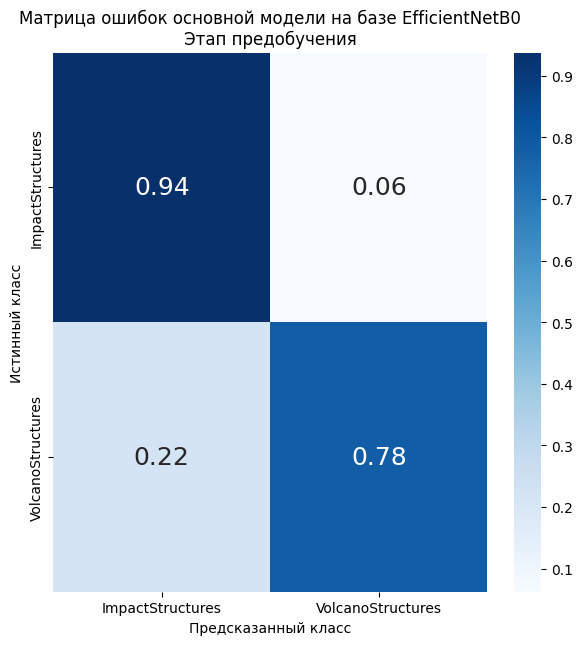

In [7]:
# Оценка качества модели, этап предобучения
y_true_list = []
y_pred_list = []

for images, labels in test_ds:
    preds = base_model.predict(images, verbose=0)

    # Обработка предсказаний
    y_pred_list.extend(np.argmax(preds, axis=1))

    # Обработка меток
    labels_np = labels.numpy()
    if len(labels_np.shape) > 1:
        y_true_list.extend(np.argmax(labels_np, axis=1))
    else:
        y_true_list.extend(labels_np)

# Матрица ошибок, этап предобучения
y_true = np.array(y_true_list)
y_pred = np.array(y_pred_list)

cm = confusion_matrix(y_true, y_pred, normalize='true')

plt.figure(figsize=(7, 7))
sns.heatmap(
    cm,
    annot=True,
    annot_kws={'size': 18},
    fmt='.2f',
    cmap='Blues',
    xticklabels=class_names,
    yticklabels=class_names
)
plt.xlabel('Предсказанный класс')
plt.ylabel('Истинный класс')
plt.title('Матрица ошибок основной модели на базе EfficientNetB0\nЭтап предобучения')
plt.show()

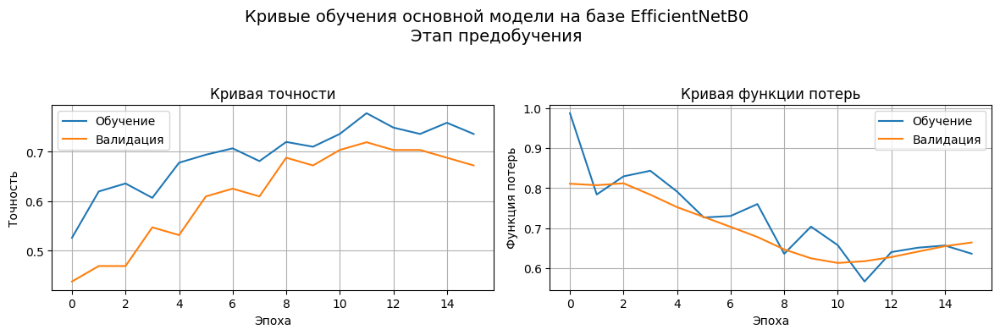

In [8]:
# Функция для визуализации кривых обучения
def plot_training_curves(history):
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    axes[0].plot(history.history['accuracy'], label='Обучение')
    axes[0].plot(history.history.get('val_accuracy', []), label='Валидация')
    axes[0].set_title('Кривая точности')
    axes[0].set_xlabel('Эпоха')
    axes[0].set_ylabel('Точность')
    axes[0].legend()
    axes[0].grid(True)

    axes[1].plot(history.history['loss'], label='Обучение')
    axes[1].plot(history.history.get('val_loss', []), label='Валидация')
    axes[1].set_title('Кривая функции потерь')
    axes[1].set_xlabel('Эпоха')
    axes[1].set_ylabel('Функция потерь')
    axes[1].legend()
    axes[1].grid(True)

    fig.suptitle(
        'Кривые обучения основной модели на базе EfficientNetB0\nЭтап предобучения',
        fontsize=14
    )

    plt.tight_layout(rect=[0, 0, 1, 0.93])
    plt.show()


# Визуализация кривых обучения, этап предобучения
plot_training_curves(base_history)

#### **Интерпретация работы**

In [9]:
# Grad-CAM
def get_gradcam_heatmap(img_tensor, model, last_conv_layer_name='top_conv', pred_index=None):
    # Извлечение компонентов модели
    flip_layer = model.get_layer('augmentation_flip')
    rot_layer = model.get_layer('augmentation_rotation')
    zoom_layer = model.get_layer('augmentation_zoom')
    contrast_layer = model.get_layer('augmentation_contrast')

    backbone = model.get_layer('efficientnetb0')

    # Создание головы
    found = False
    head_layers = []
    for layer in model.layers:
        if found:
            head_layers.append(layer)
        if layer == backbone:
            found = True

    # Вычисление GradientTape
    with tf.GradientTape() as tape:
        # Проход через аугментацию
        x = flip_layer(img_tensor, training=False)
        x = rot_layer(x, training=False)
        x = zoom_layer(x, training=False)
        x = contrast_layer(x, training=False)

        x = keras.applications.efficientnet.preprocess_input(x)

        inner_model = tf.keras.Model(
            inputs=backbone.inputs,
            outputs=[backbone.get_layer(last_conv_layer_name).output, backbone.output]
        )

        conv_outputs, backbone_features = inner_model(x, training=False)

        # Проход через финальные слои
        y = backbone_features
        for layer in head_layers:
            y = layer(y, training=False)

        predictions = y

        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    # Расчет градиентов
    grads = tape.gradient(class_channel, conv_outputs)

    # Исключение
    if grads is None:
        raise ValueError('Градиенты не найдены')

    # Сборка Heatmap
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    heatmap = conv_outputs[0] @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # Активация ReLU и нормализация
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-10)
    return heatmap.numpy()

In [10]:
# Визуализация
def plot_gradcam_comparison(img_path, heatmap, alpha=0.6):
    # Загрузка исходного снимка
    img = tf.keras.utils.load_img(img_path, target_size=(128, 128))
    img_array = tf.keras.utils.img_to_array(img) / 255.0

    # Подготовка Heatmap
    heatmap_resized = tf.image.resize(heatmap[..., np.newaxis], (128, 128))
    heatmap_resized = tf.squeeze(heatmap_resized).numpy()

    # Создание наложенного изображения (Superimposed)
    jet = cmap.get_cmap('jet')

    jet_colors = jet(heatmap_resized)

    jet_colors = jet_colors[:, :, :3]

    superimposed_img = jet_colors * alpha + img_array
    superimposed_img = np.clip(superimposed_img, 0, 1)

    # Макет для графика
    fig, axes = plt.subplots(1, 3, figsize=(10, 5))

    # Исходный снимок (левый)
    axes[0].imshow(img_array)
    axes[0].set_title('Исходный снимок')
    axes[0].axis('off')

    # Чистый Grad-CAM (средний)
    axes[1].imshow(heatmap_resized, cmap='jet')
    axes[1].set_title('Grad-CAM')
    axes[1].axis('off')

    # Наложение (правый)
    axes[2].imshow(superimposed_img)
    axes[2].set_title('Наложение')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

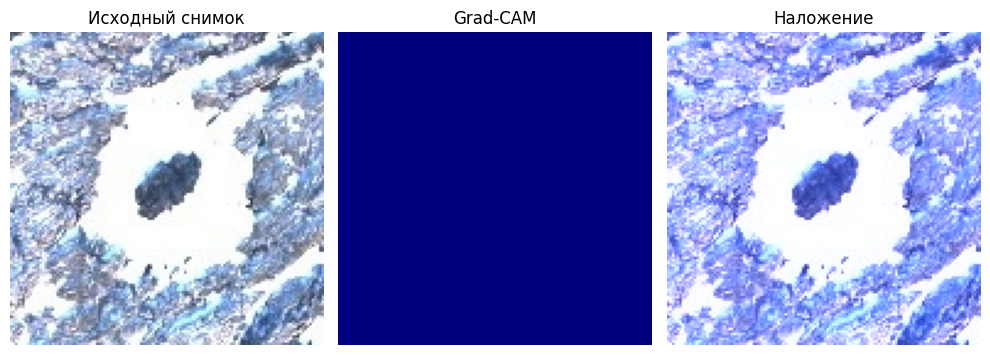

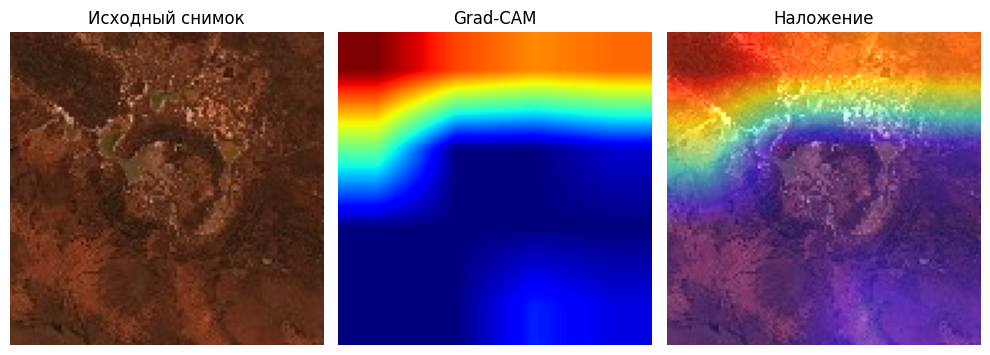

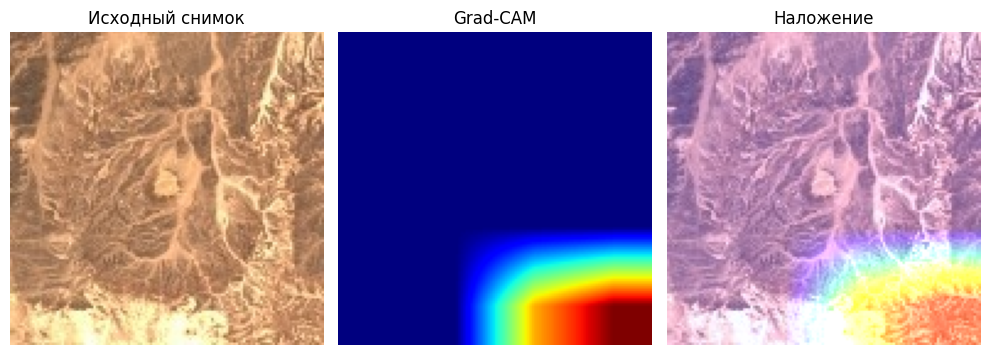

In [11]:
train_structure = random.choice(os.listdir('Dataset/03_Test/ImpactStructures/'))
val_structure = random.choice(os.listdir('Dataset/03_Test/ImpactStructures/'))
test_structure = random.choice(os.listdir('Dataset/03_Test/ImpactStructures/'))

# Вывод класс ImpactStructures
img_path = f'Dataset/03_Test/ImpactStructures/{train_structure}'
img = tf.keras.utils.load_img(img_path, target_size=(128, 128))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) # Создание батча (1, 128, 128, 3)
img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
heatmap = get_gradcam_heatmap(img_tensor, base_model, 'top_conv')
plot_gradcam_comparison(img_path, heatmap)

img_path = f'Dataset/03_Test/ImpactStructures/{val_structure}'
img = tf.keras.utils.load_img(img_path, target_size=(128, 128))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) # Создание батча (1, 128, 128, 3)
img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
heatmap = get_gradcam_heatmap(img_tensor, base_model, 'top_conv')
plot_gradcam_comparison(img_path, heatmap)

img_path = f'Dataset/03_Test/ImpactStructures/{test_structure}'
img = tf.keras.utils.load_img(img_path, target_size=(128, 128))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) # Создание батча (1, 128, 128, 3)
img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
heatmap = get_gradcam_heatmap(img_tensor, base_model, 'top_conv')
plot_gradcam_comparison(img_path, heatmap)

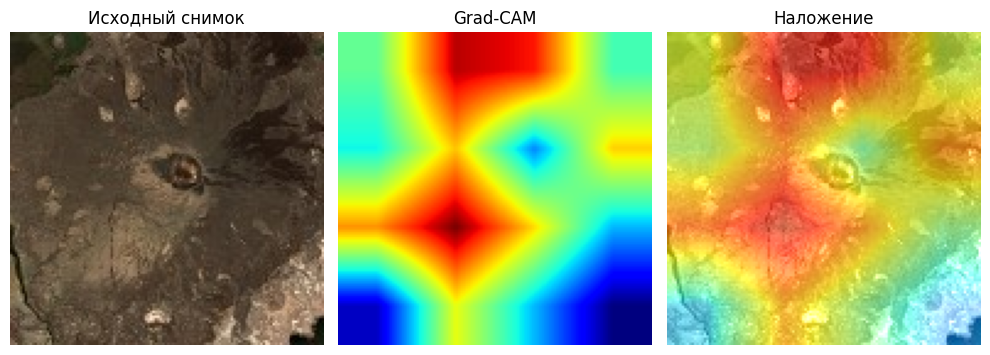

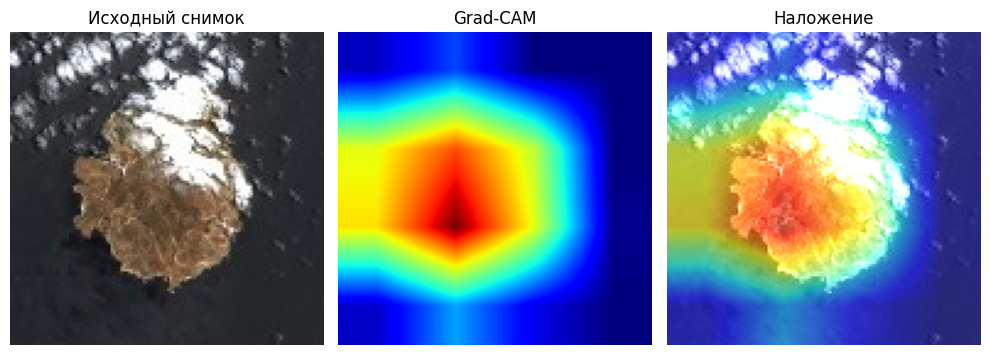

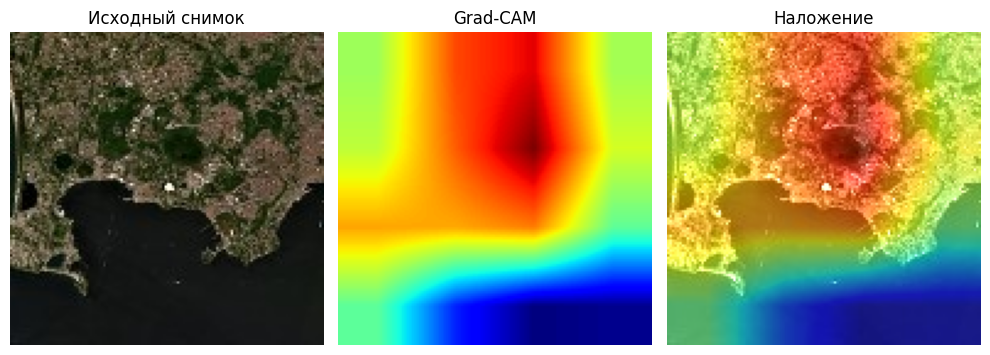

In [12]:
train_structure = random.choice(os.listdir('Dataset/03_Test/VolcanoStructures/'))
val_structure = random.choice(os.listdir('Dataset/03_Test/VolcanoStructures/'))
test_structure = random.choice(os.listdir('Dataset/03_Test/VolcanoStructures/'))

# Вывод класс ImpactStructures
img_path = f'Dataset/03_Test/VolcanoStructures/{train_structure}'
img = tf.keras.utils.load_img(img_path, target_size=(128, 128))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) # Создание батча (1, 128, 128, 3)
img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
heatmap = get_gradcam_heatmap(img_tensor, base_model, 'top_conv')
plot_gradcam_comparison(img_path, heatmap)

img_path = f'Dataset/03_Test/VolcanoStructures/{val_structure}'
img = tf.keras.utils.load_img(img_path, target_size=(128, 128))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) # Создание батча (1, 128, 128, 3)
img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
heatmap = get_gradcam_heatmap(img_tensor, base_model, 'top_conv')
plot_gradcam_comparison(img_path, heatmap)

img_path = f'Dataset/03_Test/VolcanoStructures/{test_structure}'
img = tf.keras.utils.load_img(img_path, target_size=(128, 128))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) # Создание батча (1, 128, 128, 3)
img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
heatmap = get_gradcam_heatmap(img_tensor, base_model, 'top_conv')
plot_gradcam_comparison(img_path, heatmap)

### **Дообучение**

In [13]:
# Дообучение
EfficientNetB0_backbone.trainable = True

for layer in EfficientNetB0_backbone.layers[:-5]:
    if isinstance(layer, layers.BatchNormalization):
        layer.trainable = True
    else:
        layer.trainable = False

base_model.compile(
    optimizer=keras.optimizers.Adam(1e-5),
    loss=keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
    metrics=['accuracy']
)

base_history = base_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=15,
    callbacks=[early_stopping, reduce_lr],
    verbose=1

)

Epoch 1/15
20/20 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - accuracy: 0.7484 - loss: 0.6441 - val_accuracy: 0.6875 - val_loss: 0.6211 - learning_rate: 1.0000e-05
Epoch 2/15
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 114ms/step - accuracy: 0.7387 - loss: 0.6489 - val_accuracy: 0.6719 - val_loss: 0.6363 - learning_rate: 1.0000e-05
Epoch 3/15
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - accuracy: 0.7122 - loss: 0.7991
Epoch 3: ReduceLROnPlateau reducing learning rate to 1.9999999494757505e-06.
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - accuracy: 0.7065 - loss: 0.7493 - val_accuracy: 0.6562 - val_loss: 0.6529 - learning_rate: 1.0000e-05
Epoch 4/15
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - accuracy: 0.7097 - loss: 0.6680 - val_accuracy: 0.6562 - val_loss: 0.6695 - learning_rate: 2.0000e-06
Epoch 5/15
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - accuracy: 0.7677 - loss: 0.5861 - val_accuracy: 0.6562 - val_loss: 0.6792 - learning_rate: 2.0000e-06


#### **Оценка качества**

In [14]:
# Метрики на тесте, этап дообучения
metrics = base_model.evaluate(test_ds)
metrics

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.8125 - loss: 0.5200


[0.5199644565582275, 0.8125]

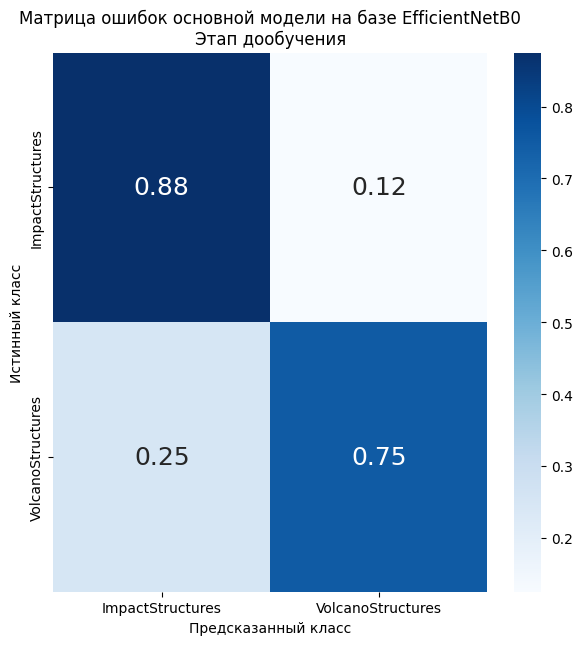

In [15]:
# Оценка качества модели, этап дообучения
y_true_list = []
y_pred_list = []

for images, labels in test_ds:
    preds = base_model.predict(images, verbose=0)

    # Обработка предсказаний
    y_pred_list.extend(np.argmax(preds, axis=1))

    # Обработка меток
    labels_np = labels.numpy()
    if len(labels_np.shape) > 1:
        y_true_list.extend(np.argmax(labels_np, axis=1))
    else:
        y_true_list.extend(labels_np)

# Матрица ошибок, этап дообучения
y_true = np.array(y_true_list)
y_pred = np.array(y_pred_list)

cm = confusion_matrix(y_true, y_pred, normalize='true')

plt.figure(figsize=(7, 7))
sns.heatmap(
    cm,
    annot=True,
    annot_kws={'size': 18},
    fmt='.2f',
    cmap='Blues',
    xticklabels=class_names,
    yticklabels=class_names
)
plt.xlabel('Предсказанный класс')
plt.ylabel('Истинный класс')
plt.title('Матрица ошибок основной модели на базе EfficientNetB0\nЭтап дообучения')
plt.show()

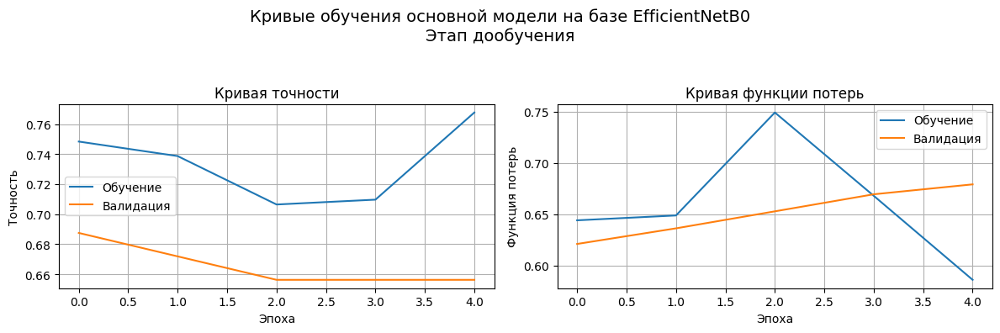

In [16]:
# Функция для визуализации кривых обучения
def plot_training_curves(history):
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    axes[0].plot(history.history['accuracy'], label='Обучение')
    axes[0].plot(history.history.get('val_accuracy', []), label='Валидация')
    axes[0].set_title('Кривая точности')
    axes[0].set_xlabel('Эпоха')
    axes[0].set_ylabel('Точность')
    axes[0].legend()
    axes[0].grid(True)

    axes[1].plot(history.history['loss'], label='Обучение')
    axes[1].plot(history.history.get('val_loss', []), label='Валидация')
    axes[1].set_title('Кривая функции потерь')
    axes[1].set_xlabel('Эпоха')
    axes[1].set_ylabel('Функция потерь')
    axes[1].legend()
    axes[1].grid(True)

    fig.suptitle(
        'Кривые обучения основной модели на базе EfficientNetB0\nЭтап дообучения',
        fontsize=14
    )

    plt.tight_layout(rect=[0, 0, 1, 0.93])
    plt.show()


# Визуализация кривых обучения, этап дообучения
plot_training_curves(base_history)

#### **Интерпретация работы**

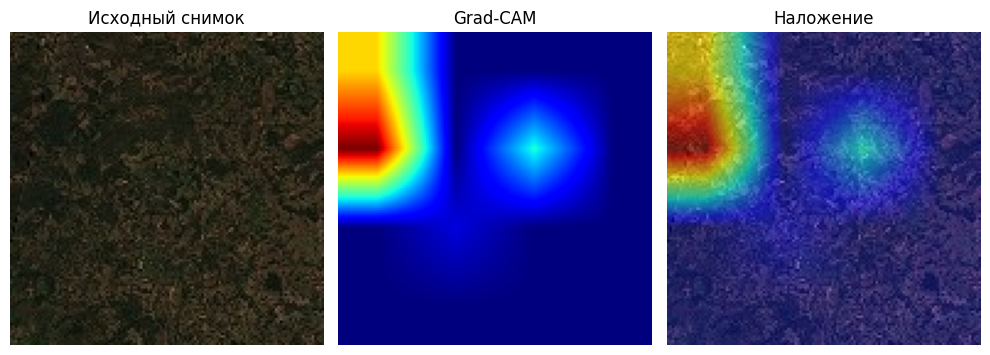

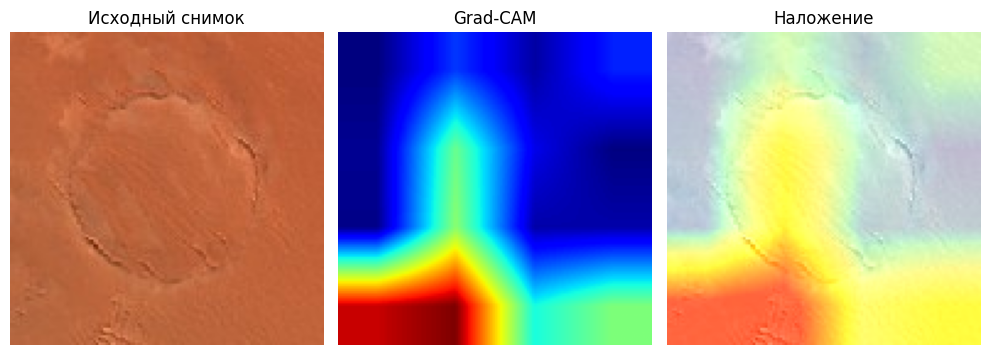

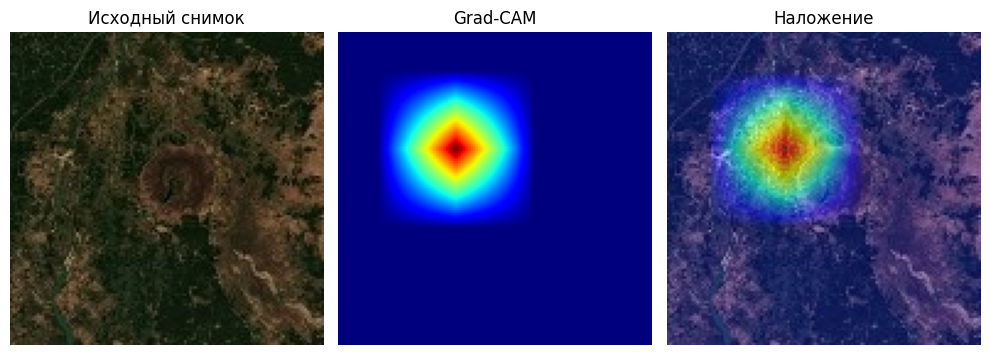

In [17]:
train_structure = random.choice(os.listdir('Dataset/03_Test/ImpactStructures/'))
val_structure = random.choice(os.listdir('Dataset/03_Test/ImpactStructures/'))
test_structure = random.choice(os.listdir('Dataset/03_Test/ImpactStructures/'))

# Вывод класс ImpactStructures
img_path = f'Dataset/03_Test/ImpactStructures/{train_structure}'
img = tf.keras.utils.load_img(img_path, target_size=(128, 128))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) # Создание батча (1, 128, 128, 3)
img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
heatmap = get_gradcam_heatmap(img_tensor, base_model, 'top_conv')
plot_gradcam_comparison(img_path, heatmap)

img_path = f'Dataset/03_Test/ImpactStructures/{val_structure}'
img = tf.keras.utils.load_img(img_path, target_size=(128, 128))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) # Создание батча (1, 128, 128, 3)
img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
heatmap = get_gradcam_heatmap(img_tensor, base_model, 'top_conv')
plot_gradcam_comparison(img_path, heatmap)

img_path = f'Dataset/03_Test/ImpactStructures/{test_structure}'
img = tf.keras.utils.load_img(img_path, target_size=(128, 128))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) # Создание батча (1, 128, 128, 3)
img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
heatmap = get_gradcam_heatmap(img_tensor, base_model, 'top_conv')
plot_gradcam_comparison(img_path, heatmap)

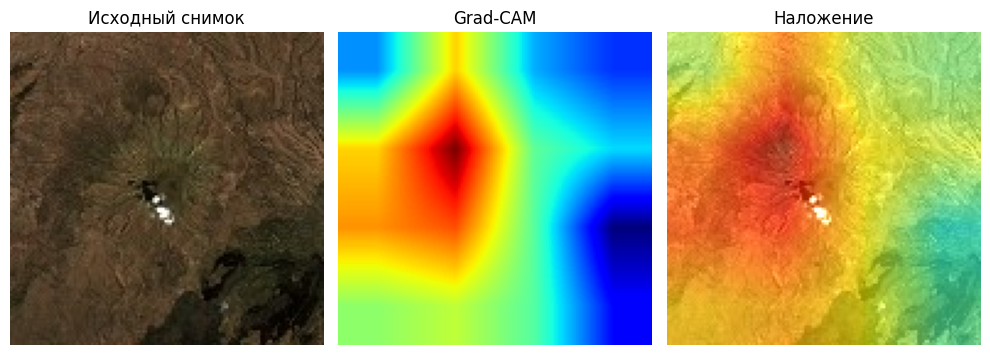

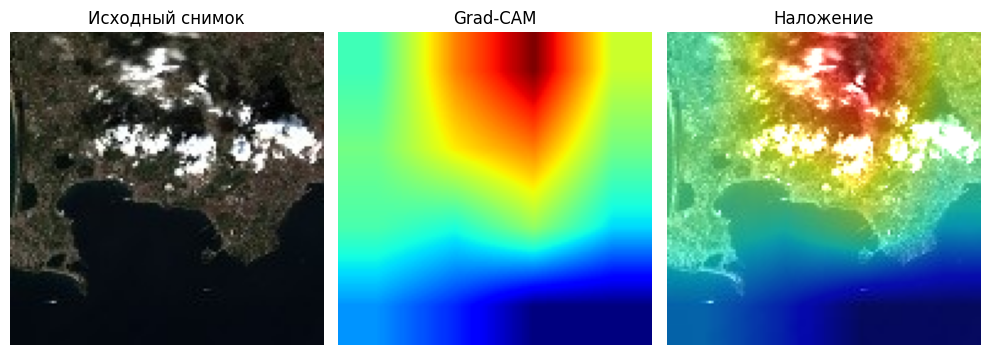

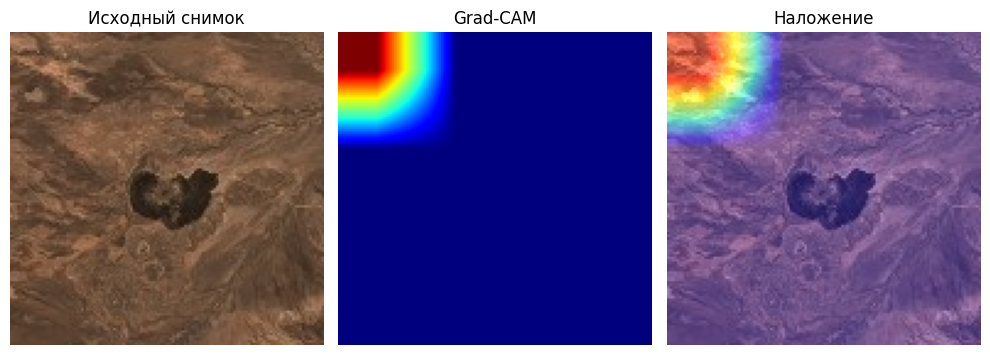

In [18]:
train_structure = random.choice(os.listdir('Dataset/03_Test/VolcanoStructures/'))
val_structure = random.choice(os.listdir('Dataset/03_Test/VolcanoStructures/'))
test_structure = random.choice(os.listdir('Dataset/03_Test/VolcanoStructures/'))

# Вывод класс ImpactStructures
img_path = f'Dataset/03_Test/VolcanoStructures/{train_structure}'
img = tf.keras.utils.load_img(img_path, target_size=(128, 128))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) # Создание батча (1, 128, 128, 3)
img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
heatmap = get_gradcam_heatmap(img_tensor, base_model, 'top_conv')
plot_gradcam_comparison(img_path, heatmap)

img_path = f'Dataset/03_Test/VolcanoStructures/{val_structure}'
img = tf.keras.utils.load_img(img_path, target_size=(128, 128))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) # Создание батча (1, 128, 128, 3)
img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
heatmap = get_gradcam_heatmap(img_tensor, base_model, 'top_conv')
plot_gradcam_comparison(img_path, heatmap)

img_path = f'Dataset/03_Test/VolcanoStructures/{test_structure}'
img = tf.keras.utils.load_img(img_path, target_size=(128, 128))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) # Создание батча (1, 128, 128, 3)
img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
heatmap = get_gradcam_heatmap(img_tensor, base_model, 'top_conv')
plot_gradcam_comparison(img_path, heatmap)

### **Сохранение модели**

In [19]:
# Сохранение схемы архитектуры модели
plot_model(base_model, to_file='Models/EfficientNetB0_base_model.png', show_shapes=True, show_layer_names=True)

You must install graphviz (see instructions at https://graphviz.gitlab.io/download/) for `plot_model` to work.


In [20]:
# Сохранение модели
base_model.save('Models/EfficientNetB0_base_model.keras')

# **Модель на основе MobileNetV2 (альтернативная)**

## **Разработка архитектуры**

In [21]:
# Альтернативная модель
MobileNetV2_backbone = MobileNetV2(
    include_top=False,
    weights='imagenet',
    input_shape=(IMG_SIZE, IMG_SIZE, 3)
)

# Разрешаем обучение
MobileNetV2_backbone.trainable = False

# Замораживаем все, кроме BatchNormalization
for layer in EfficientNetB0_backbone.layers:
    if isinstance(layer, layers.BatchNormalization):
        layer.trainable = True
    else:
        layer.trainable = False

# Вход
inputs = keras.Input(shape=(IMG_SIZE, IMG_SIZE, 3), name='input_layer')

# Аугментация
x = layers.RandomFlip('horizontal', name='augmentation_flip')(inputs)
x = layers.RandomRotation(0.15, name='augmentation_rotation')(x)
x = layers.RandomZoom(0.15, name='augmentation_zoom')(x)
x = layers.RandomContrast(0.2, name='augmentation_contrast')(x)

# Предобработка и базовая модель
x = keras.applications.mobilenet_v2.preprocess_input(x)
x = MobileNetV2_backbone(x)

# Новая голова
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
x = layers.BatchNormalization()(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.4)(x)

# Выход
outputs = layers.Dense(NUM_CLASSES, activation='softmax')(x)

# Сборка модели
alt_model = keras.Model(inputs, outputs, name='MobileNetV2_alt_model')

alt_model.compile(
    optimizer=keras.optimizers.Adam(1e-4),
    loss=keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
    metrics=['accuracy']
)

alt_model.summary()

Model: "MobileNetV2_alt_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ augmentation_flip (RandomFlip)       │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ augmentation_rotation                │ (None, 128, 128, 3)         │               0 │
│ (RandomRotation)                     │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ augmentation_zoom (RandomZoom)       │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ augmentation_contrast                │ (None, 128, 128, 3)         │               0 │
│ (RandomContrast)                     │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ true_divide (TrueDivide)             │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ subtract (Subtract)                  │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_128 (Functional)    │ (None, 4, 4, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 1280)                │           5,120 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │         163,968 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 2)                   │             258 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,427,330 (9.26 MB)

 Trainable params: 166,786 (651.51 KB)

 Non-trainable params: 2,260,544 (8.62 MB)

## **Трансферное обучение**

### **Предобучение**

In [22]:
# Обучение классификатора
alt_history = alt_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=25,
    callbacks=[early_stopping, reduce_lr],
    verbose=1
)

Epoch 1/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.5226 - loss: 1.0094 - val_accuracy: 0.5625 - val_loss: 0.7814 - learning_rate: 1.0000e-04
Epoch 2/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.6161 - loss: 0.8868 - val_accuracy: 0.5938 - val_loss: 0.7199 - learning_rate: 1.0000e-04
Epoch 3/25
18/20 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.6265 - loss: 0.8560
Epoch 3: ReduceLROnPlateau reducing learning rate to 1.9999999494757503e-05.
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.6226 - loss: 0.8597 - val_accuracy: 0.6406 - val_loss: 0.6613 - learning_rate: 1.0000e-04
Epoch 4/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.6774 - loss: 0.7753 - val_accuracy: 0.6094 - val_loss: 0.6385 - learning_rate: 2.0000e-05
Epoch 5/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.6774 - loss: 0.7826 - val_accuracy: 0.6406 - val_loss: 0.6265 - learning_rate: 2.0000e-05


#### **Оценка качества**

In [23]:
# Метрики на тесте, этап предобучения
metrics = alt_model.evaluate(test_ds)
metrics

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5469 - loss: 0.8867


[0.8867181539535522, 0.546875]

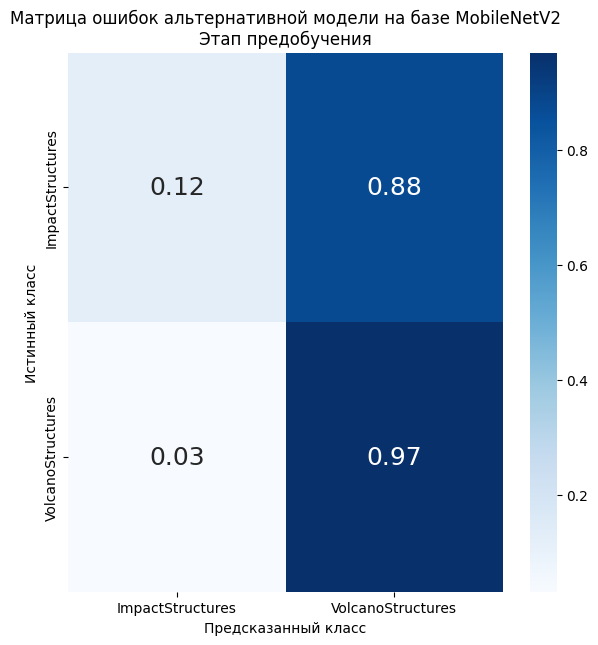

In [24]:
# Оценка качества модели, этап предобучения
y_true_list = []
y_pred_list = []

for images, labels in test_ds:
    preds = alt_model.predict(images, verbose=0)

    # Обработка предсказаний
    y_pred_list.extend(np.argmax(preds, axis=1))

    # Обработка меток
    labels_np = labels.numpy()
    if len(labels_np.shape) > 1:
        y_true_list.extend(np.argmax(labels_np, axis=1))
    else:
        y_true_list.extend(labels_np)

# Матрица ошибок, этап предобучения
y_true = np.array(y_true_list)
y_pred = np.array(y_pred_list)

cm = confusion_matrix(y_true, y_pred, normalize='true')

plt.figure(figsize=(7, 7))
sns.heatmap(
    cm,
    annot=True,
    annot_kws={'size': 18},
    fmt='.2f',
    cmap='Blues',
    xticklabels=class_names,
    yticklabels=class_names
)
plt.xlabel('Предсказанный класс')
plt.ylabel('Истинный класс')
plt.title('Матрица ошибок альтернативной модели на базе MobileNetV2\nЭтап предобучения')
plt.show()

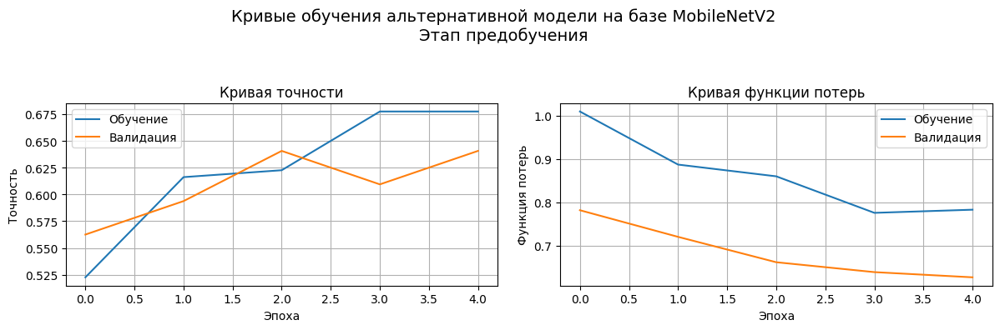

In [25]:
# Функция для визуализации кривых обучения
def plot_training_curves(history):
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    axes[0].plot(history.history['accuracy'], label='Обучение')
    axes[0].plot(history.history.get('val_accuracy', []), label='Валидация')
    axes[0].set_title('Кривая точности')
    axes[0].set_xlabel('Эпоха')
    axes[0].set_ylabel('Точность')
    axes[0].legend()
    axes[0].grid(True)

    axes[1].plot(history.history['loss'], label='Обучение')
    axes[1].plot(history.history.get('val_loss', []), label='Валидация')
    axes[1].set_title('Кривая функции потерь')
    axes[1].set_xlabel('Эпоха')
    axes[1].set_ylabel('Функция потерь')
    axes[1].legend()
    axes[1].grid(True)

    fig.suptitle(
        'Кривые обучения альтернативной модели на базе MobileNetV2\nЭтап предобучения',
        fontsize=14
    )

    plt.tight_layout(rect=[0, 0, 1, 0.93])
    plt.show()


# Визуализация кривых обучения, этап предобучения
plot_training_curves(alt_history)

#### **Интерпретация работы модели**

In [26]:
# Grad-CAM
def get_gradcam_heatmap(img_tensor, model, last_conv_layer_name='out_relu', pred_index=None):
    # Извлечение компонентов модели
    flip_layer = model.get_layer('augmentation_flip')
    rot_layer = model.get_layer('augmentation_rotation')
    zoom_layer = model.get_layer('augmentation_zoom')
    contrast_layer = model.get_layer('augmentation_contrast')
    backbone = model.get_layer('mobilenetv2_1.00_128')

    # Создание головы
    found = False
    head_layers = []
    for layer in model.layers:
        if found:
            head_layers.append(layer)
        if layer == backbone:
            found = True

    # Вычисление GradientTape
    with tf.GradientTape() as tape:
        # Проход через аугментацию
        x = flip_layer(img_tensor, training=False)
        x = rot_layer(x, training=False)
        x = zoom_layer(x, training=False)
        x = contrast_layer(x, training=False)

        x = keras.applications.mobilenet_v2.preprocess_input(x)

        inner_model = tf.keras.Model(
            inputs=backbone.inputs,
            outputs=[backbone.get_layer(last_conv_layer_name).output, backbone.output]
        )

        conv_outputs, backbone_features = inner_model(x, training=False)

        # Проход через финальные слои
        y = backbone_features
        for layer in head_layers:
            y = layer(y, training=False)

        predictions = y

        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    # Расчет градиентов
    grads = tape.gradient(class_channel, conv_outputs)

    # Исключение
    if grads is None:
        raise ValueError('Градиенты не найдены')

    # Сборка Heatmap
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    heatmap = conv_outputs[0] @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # Активация ReLU и нормализация
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-10)
    return heatmap.numpy()

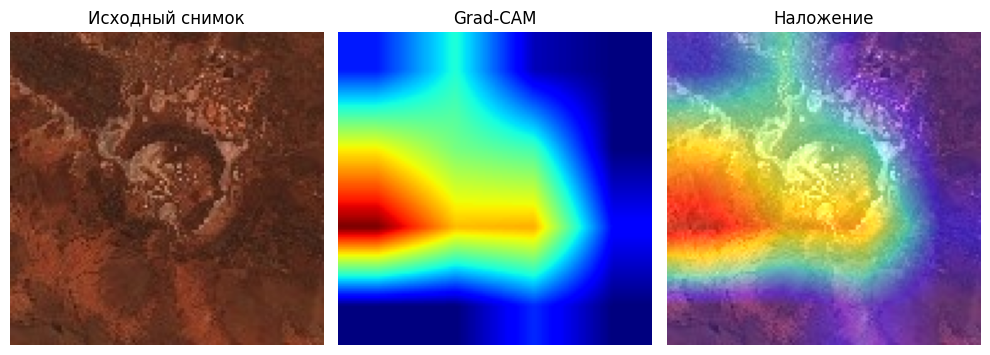

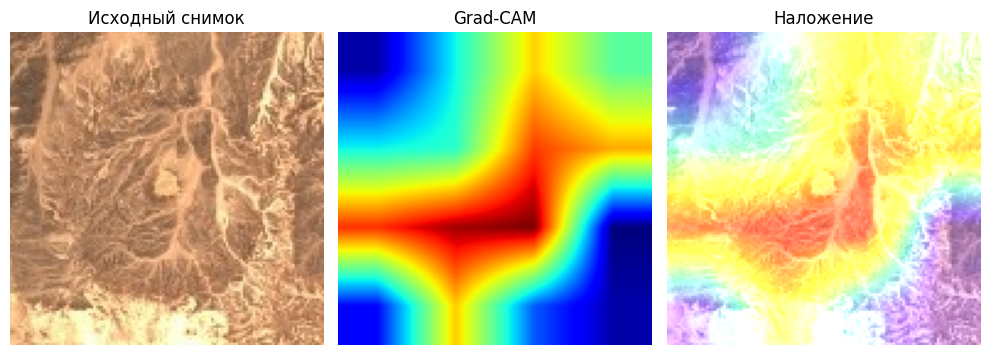

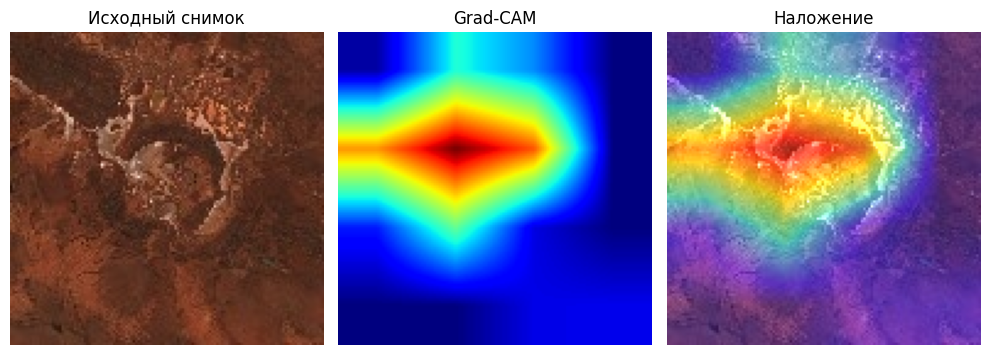

In [27]:
train_structure = random.choice(os.listdir('Dataset/03_Test/ImpactStructures/'))
val_structure = random.choice(os.listdir('Dataset/03_Test/ImpactStructures/'))
test_structure = random.choice(os.listdir('Dataset/03_Test/ImpactStructures/'))

# Вывод класс ImpactStructures
img_path = f'Dataset/03_Test/ImpactStructures/{train_structure}'
img = tf.keras.utils.load_img(img_path, target_size=(128, 128))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) # Создание батча (1, 128, 128, 3)
img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
heatmap = get_gradcam_heatmap(img_tensor, alt_model, 'out_relu')
plot_gradcam_comparison(img_path, heatmap)

img_path = f'Dataset/03_Test/ImpactStructures/{val_structure}'
img = tf.keras.utils.load_img(img_path, target_size=(128, 128))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) # Создание батча (1, 128, 128, 3)
img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
heatmap = get_gradcam_heatmap(img_tensor, alt_model, 'out_relu')
plot_gradcam_comparison(img_path, heatmap)

img_path = f'Dataset/03_Test/ImpactStructures/{test_structure}'
img = tf.keras.utils.load_img(img_path, target_size=(128, 128))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) # Создание батча (1, 128, 128, 3)
img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
heatmap = get_gradcam_heatmap(img_tensor, alt_model, 'out_relu')
plot_gradcam_comparison(img_path, heatmap)

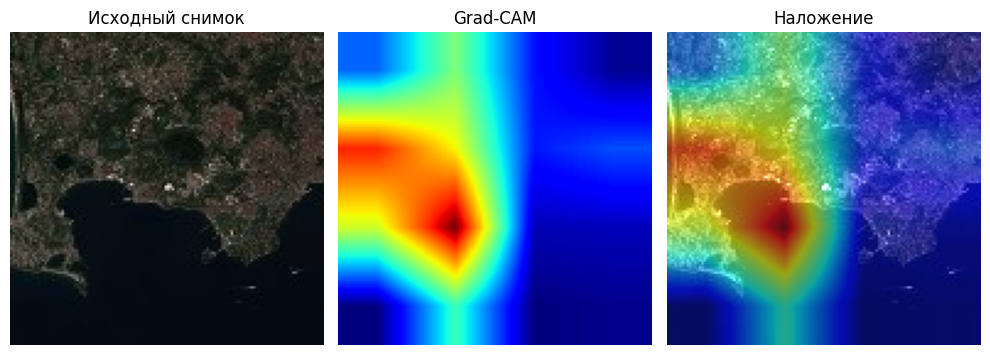

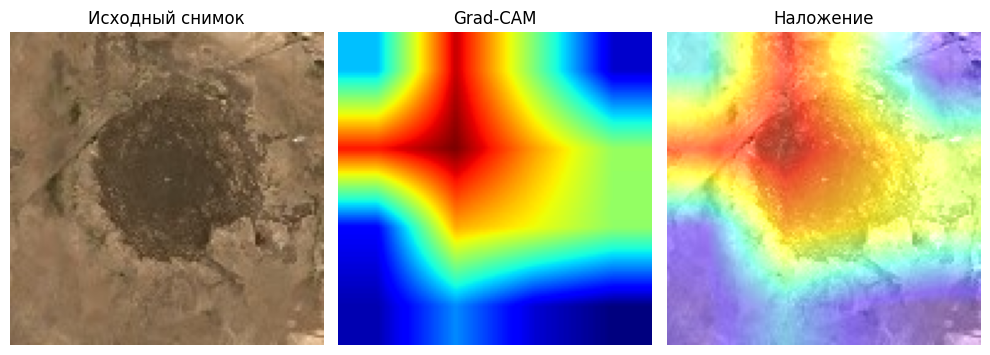

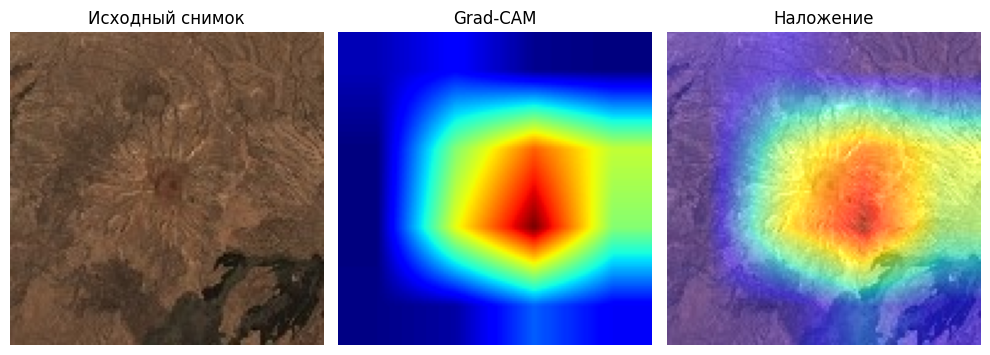

In [28]:
train_structure = random.choice(os.listdir('Dataset/03_Test/VolcanoStructures/'))
val_structure = random.choice(os.listdir('Dataset/03_Test/VolcanoStructures/'))
test_structure = random.choice(os.listdir('Dataset/03_Test/VolcanoStructures/'))

# Вывод класс ImpactStructures
img_path = f'Dataset/03_Test/VolcanoStructures/{train_structure}'
img = tf.keras.utils.load_img(img_path, target_size=(128, 128))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) # Создание батча (1, 128, 128, 3)
img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
heatmap = get_gradcam_heatmap(img_tensor, alt_model, 'out_relu')
plot_gradcam_comparison(img_path, heatmap)

img_path = f'Dataset/03_Test/VolcanoStructures/{val_structure}'
img = tf.keras.utils.load_img(img_path, target_size=(128, 128))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) # Создание батча (1, 128, 128, 3)
img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
heatmap = get_gradcam_heatmap(img_tensor, alt_model, 'out_relu')
plot_gradcam_comparison(img_path, heatmap)

img_path = f'Dataset/03_Test/VolcanoStructures/{test_structure}'
img = tf.keras.utils.load_img(img_path, target_size=(128, 128))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) # Создание батча (1, 128, 128, 3)
img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
heatmap = get_gradcam_heatmap(img_tensor, alt_model, 'out_relu')
plot_gradcam_comparison(img_path, heatmap)

### **Дообучение**

In [29]:
# Дообучение
MobileNetV2_backbone.trainable = True

for layer in EfficientNetB0_backbone.layers[:-5]:
    if isinstance(layer, layers.BatchNormalization):
        layer.trainable = True
    else:
        layer.trainable = False

MobileNetV2_backbone.compile(
    optimizer=keras.optimizers.Adam(1e-5),
    loss=keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
    metrics=['accuracy']
)

alt_history = alt_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=15,
    callbacks=[early_stopping, reduce_lr],
    verbose=1

)

Epoch 1/15
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.5710 - loss: 0.9353 - val_accuracy: 0.5625 - val_loss: 0.7320 - learning_rate: 2.0000e-05
Epoch 2/15
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.5742 - loss: 0.9029 - val_accuracy: 0.6094 - val_loss: 0.7026 - learning_rate: 2.0000e-05
Epoch 3/15
17/20 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.6329 - loss: 0.8558
Epoch 3: ReduceLROnPlateau reducing learning rate to 3.999999898951501e-06.
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.6194 - loss: 0.8443 - val_accuracy: 0.5938 - val_loss: 0.6834 - learning_rate: 2.0000e-05
Epoch 4/15
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.5806 - loss: 0.9189 - val_accuracy: 0.5938 - val_loss: 0.6759 - learning_rate: 4.0000e-06
Epoch 5/15
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.6000 - loss: 0.8680 - val_accuracy: 0.6094 - val_loss: 0.6779 - learning_rate: 4.0000e-06


#### **Оценка качества**

In [30]:
# Метрики на тесте этап дообучения
metrics = alt_model.evaluate(test_ds)
metrics

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5625 - loss: 0.8032


[0.8032160401344299, 0.5625]

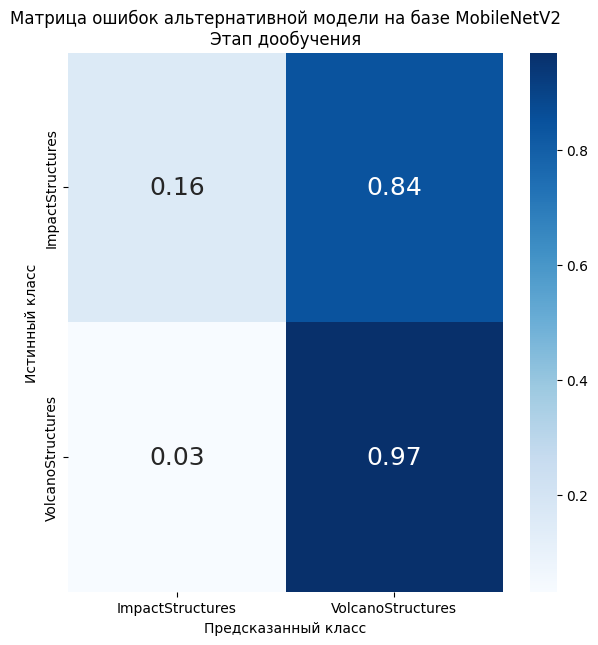

In [31]:
# Оценка качества модели, этап предобучения
y_true_list = []
y_pred_list = []

for images, labels in test_ds:
    preds = alt_model.predict(images, verbose=0)

    # Обработка предсказаний
    y_pred_list.extend(np.argmax(preds, axis=1))

    # Обработка меток
    labels_np = labels.numpy()
    if len(labels_np.shape) > 1:
        y_true_list.extend(np.argmax(labels_np, axis=1))
    else:
        y_true_list.extend(labels_np)

# Матрица ошибок, этап предобучения
y_true = np.array(y_true_list)
y_pred = np.array(y_pred_list)

cm = confusion_matrix(y_true, y_pred, normalize='true')

plt.figure(figsize=(7, 7))
sns.heatmap(
    cm,
    annot=True,
    annot_kws={'size': 18},
    fmt='.2f',
    cmap='Blues',
    xticklabels=class_names,
    yticklabels=class_names
)
plt.xlabel('Предсказанный класс')
plt.ylabel('Истинный класс')
plt.title('Матрица ошибок альтернативной модели на базе MobileNetV2\nЭтап дообучения')
plt.show()

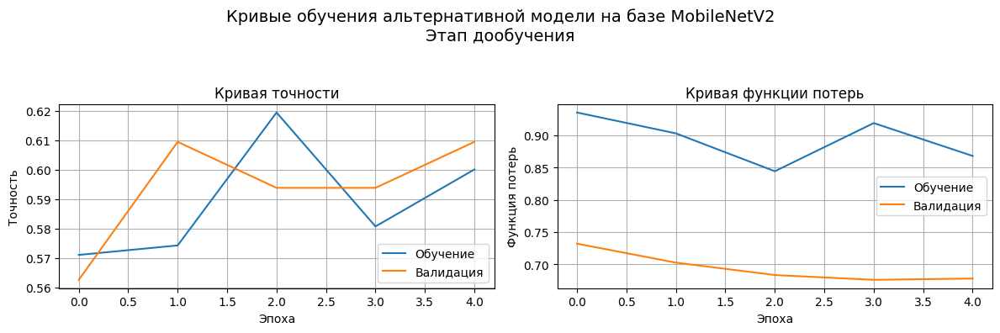

In [32]:
# Функция для визуализации кривых обучения
def plot_training_curves(history):
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    axes[0].plot(history.history['accuracy'], label='Обучение')
    axes[0].plot(history.history.get('val_accuracy', []), label='Валидация')
    axes[0].set_title('Кривая точности')
    axes[0].set_xlabel('Эпоха')
    axes[0].set_ylabel('Точность')
    axes[0].legend()
    axes[0].grid(True)

    axes[1].plot(history.history['loss'], label='Обучение')
    axes[1].plot(history.history.get('val_loss', []), label='Валидация')
    axes[1].set_title('Кривая функции потерь')
    axes[1].set_xlabel('Эпоха')
    axes[1].set_ylabel('Функция потерь')
    axes[1].legend()
    axes[1].grid(True)

    fig.suptitle(
        'Кривые обучения альтернативной модели на базе MobileNetV2\nЭтап дообучения',
        fontsize=14
    )

    plt.tight_layout(rect=[0, 0, 1, 0.93])
    plt.show()


# Визуализация кривых обучения, этап предобучения
plot_training_curves(alt_history)

#### **Интерпретация работы**

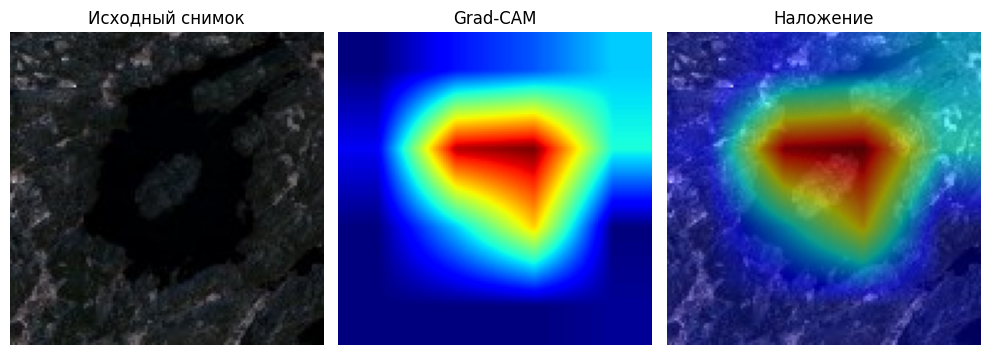

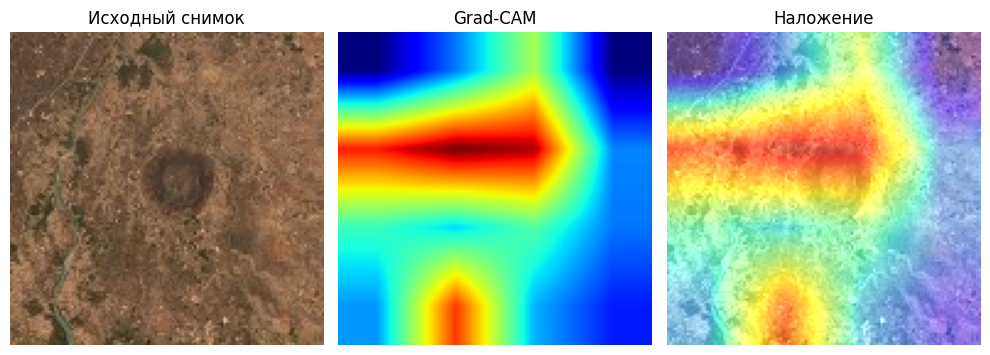

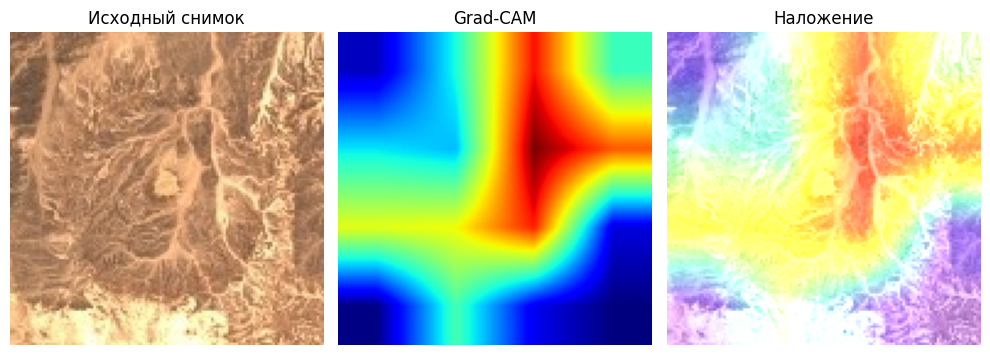

In [38]:
train_structure = random.choice(os.listdir('Dataset/03_Test/ImpactStructures/'))
val_structure = random.choice(os.listdir('Dataset/03_Test/ImpactStructures/'))
test_structure = random.choice(os.listdir('Dataset/03_Test/ImpactStructures/'))

# Вывод класс ImpactStructures
img_path = f'Dataset/03_Test/ImpactStructures/{train_structure}'
img = tf.keras.utils.load_img(img_path, target_size=(128, 128))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) # Создание батча (1, 128, 128, 3)
img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
heatmap = get_gradcam_heatmap(img_tensor, alt_model, 'out_relu')
plot_gradcam_comparison(img_path, heatmap)

img_path = f'Dataset/03_Test/ImpactStructures/{val_structure}'
img = tf.keras.utils.load_img(img_path, target_size=(128, 128))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) # Создание батча (1, 128, 128, 3)
img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
heatmap = get_gradcam_heatmap(img_tensor, alt_model, 'out_relu')
plot_gradcam_comparison(img_path, heatmap)

img_path = f'Dataset/03_Test/ImpactStructures/{test_structure}'
img = tf.keras.utils.load_img(img_path, target_size=(128, 128))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) # Создание батча (1, 128, 128, 3)
img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
heatmap = get_gradcam_heatmap(img_tensor, alt_model, 'out_relu')
plot_gradcam_comparison(img_path, heatmap)

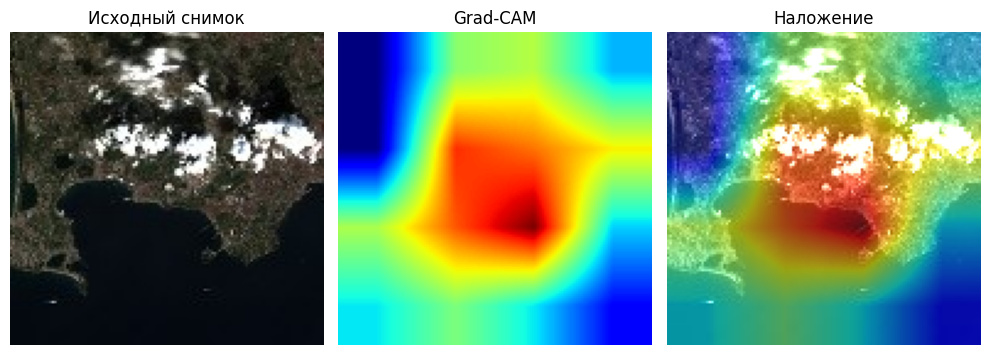

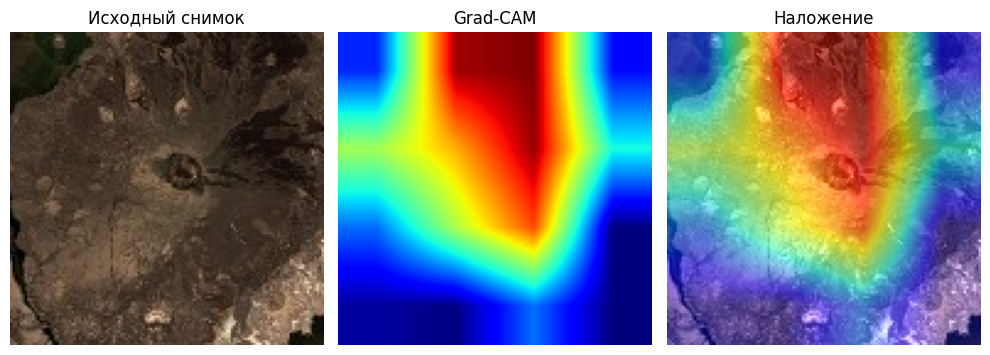

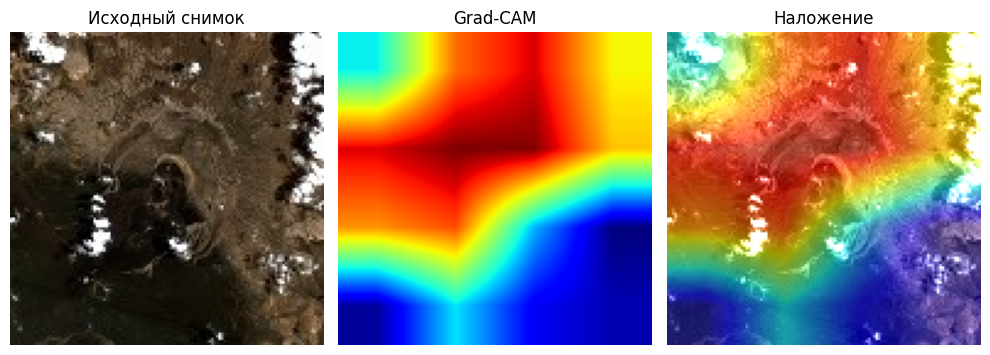

In [39]:
train_structure = random.choice(os.listdir('Dataset/03_Test/VolcanoStructures/'))
val_structure = random.choice(os.listdir('Dataset/03_Test/VolcanoStructures/'))
test_structure = random.choice(os.listdir('Dataset/03_Test/VolcanoStructures/'))

# Вывод класс ImpactStructures
img_path = f'Dataset/03_Test/VolcanoStructures/{train_structure}'
img = tf.keras.utils.load_img(img_path, target_size=(128, 128))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) # Создание батча (1, 128, 128, 3)
img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
heatmap = get_gradcam_heatmap(img_tensor, alt_model, 'out_relu')
plot_gradcam_comparison(img_path, heatmap)

img_path = f'Dataset/03_Test/VolcanoStructures/{val_structure}'
img = tf.keras.utils.load_img(img_path, target_size=(128, 128))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) # Создание батча (1, 128, 128, 3)
img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
heatmap = get_gradcam_heatmap(img_tensor, alt_model, 'out_relu')
plot_gradcam_comparison(img_path, heatmap)

img_path = f'Dataset/03_Test/VolcanoStructures/{test_structure}'
img = tf.keras.utils.load_img(img_path, target_size=(128, 128))
img_array = tf.keras.utils.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) # Создание батча (1, 128, 128, 3)
img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
heatmap = get_gradcam_heatmap(img_tensor, alt_model, 'out_relu')
plot_gradcam_comparison(img_path, heatmap)

## **Сохранение модели**

In [35]:
# Сохранение схемы архитектуры модели
plot_model(alt_model, to_file='Models/MobileNetV2_alt_model.png', show_shapes=True, show_layer_names=True)

You must install graphviz (see instructions at https://graphviz.gitlab.io/download/) for `plot_model` to work.


In [36]:
# Сохранение модели
alt_model.save('Models/MobileNetV2_alt_model.keras')